In [1]:
import sys
sys.path.append("../utils")
from utils import *
from omegaconf import OmegaConf

In [4]:
conf = OmegaConf.create(
    {   
        # General data args
        "data_dirs": {
            "kumar": {
                "train_im":"../../../../datasets/nucleisegmentation_kumar/train/Images",
                "train_gt":"../../../../datasets/nucleisegmentation_kumar/train/Labels",
                "test_im":"../../../../datasets/nucleisegmentation_kumar/test/Images",
                "test_gt":"../../../../datasets/nucleisegmentation_kumar/test/Labels",
            },
            "consep":{
                "train_im":"../../../../datasets/nucleisegmentation_consep/train/Images",
                "train_gt":"../../../../datasets/nucleisegmentation_consep/train/Labels",
                "test_im":"../../../../datasets/nucleisegmentation_consep/test/Images",
                "test_gt":"../../../../datasets/nucleisegmentation_consep/test/Labels",
            },
            "pannuke": {
                "train_im":"../../../../datasets/nucleisegmentation_pannuke/train/Images",
                "train_gt":"../../../../datasets/nucleisegmentation_pannuke/train/Labels",
                "valid_im":"../../../../datasets/nucleisegmentation_pannuke/valid/Images",
                "valid_gt":"../../../../datasets/nucleisegmentation_pannuke/valid/Labels",
                "test_im":"../../../../datasets/nucleisegmentation_pannuke/test/Images",
                "test_gt":"../../../../datasets/nucleisegmentation_pannuke/test/Labels",
            },
            "other": {
                # TODO:
                "train_im":"../../../../datasets/other/...",
                "train_gt":"../../../../datasets/other/...",
                "test_im":"../../../../datasets/other/...",
                "train_gt":"../../../../datasets/other/...",
            }
        },
        "dataset":"kumar", # What dataset you want to use?
        "binary_classes": {
            "background":0,
            "nuclei":1
        },
        "consep_classes":{
            'background':0,
            # TODO: rest off the classes
        },
        "consep_classes":{
            'background':0,
            # TODO: rest off the classes
        },
        
        # HDF5 Database args
        "database_root_dir":"../../../../databases",
        "patch_size":512, # Size of an image patch that gets written to hdf5 db
        "stride_size":80, # Size of window stride (same as in hovernet paper)
        "phases":["train", "valid", "test"], # or ["train", "test"]

        # Model training args
        "experiment_root_dir":"../../../../results/tests/",
        "model_name":"FPN",
        "experiment_version":"test5",
        "batch_size":6,
        "resume_training":True, # continue training where you left off?
        "num_epochs":7,
        "num_gpus":1,
        
        "optimizer_args":{
            "lr":0.001,
            "encoder_lr":0.0005,
            "weight_decay":0.0003,
            "encoder_weight_decay":0.00003
        },
        
        "scheduler_args": {
            "factor":0.25,
            "patience":2
        },
    
        "loss_args" : {
            "edge_weight" : 1.1,
        },
        
        # Inference args
        "inference_args" : {
            "smoothen":True
        }

    }
)

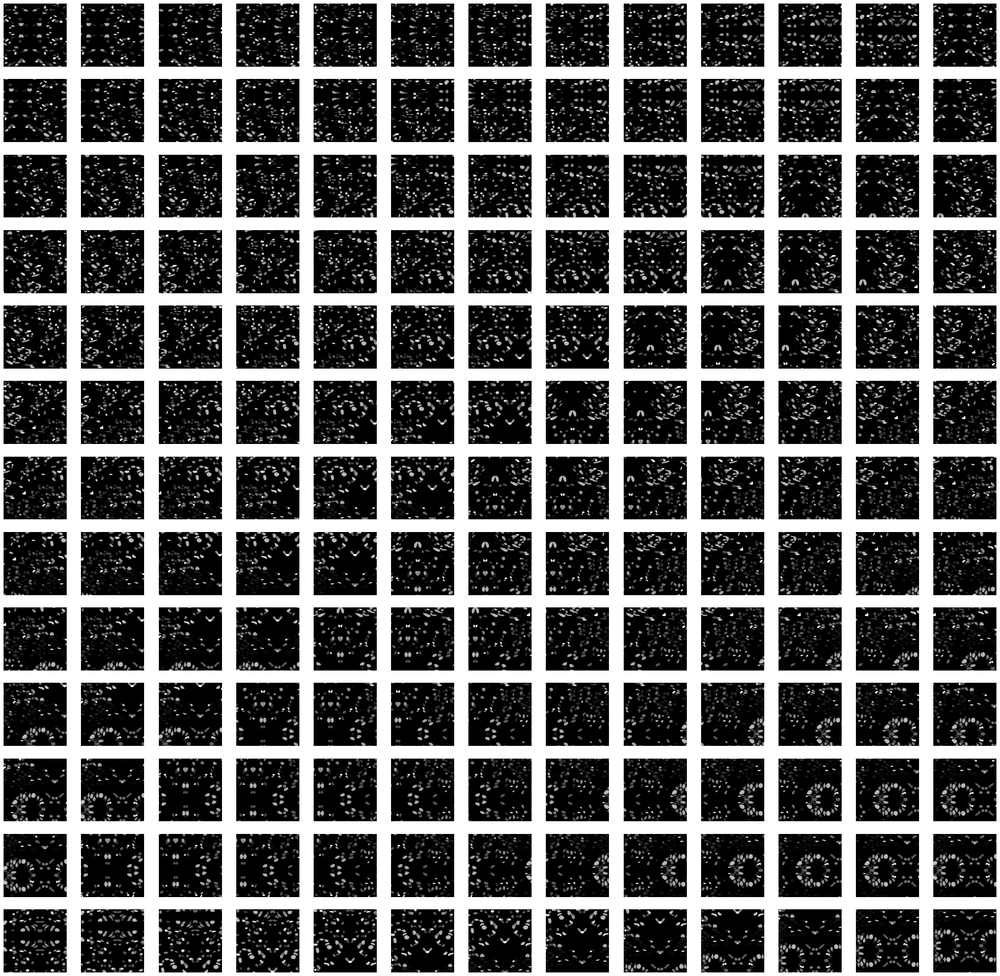

In [5]:
writer_kumar = DB_writer(conf, verbose=False)
writer_kumar.viz_patches_example(index=3, img_type="mask", phase="test")

In [6]:
writer_kumar.write_dbs()

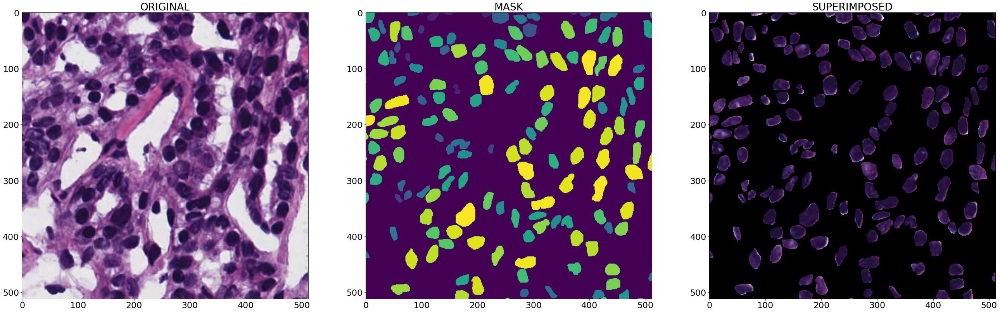

array([  0,  49,  54,  55,  56,  58,  72,  74,  91,  96, 105, 113, 123,
       130, 146, 156, 167, 180, 181, 187, 190, 191, 193, 194, 200, 201,
       203, 204, 208, 214, 215, 216, 217, 218, 220, 223, 231, 232, 234,
       235, 242, 243, 255, 276, 277, 284, 287, 289, 295, 297, 299, 308,
       310, 316, 329, 332, 333, 337, 340, 342, 345, 346, 347, 351, 352,
       353, 360, 362, 363, 364, 365, 366, 368, 371, 373, 378, 380, 381,
       383, 387, 395, 396, 400, 401, 402, 410, 415, 420, 421, 423, 424,
       425, 428, 430, 434, 441, 442, 446, 448, 449, 453, 456, 458, 461,
       462, 468, 473, 474, 478, 480, 484, 489, 491, 492, 494, 495, 496,
       497, 503, 506, 508, 510, 511, 512, 513, 516, 517, 518, 519, 527,
       530, 531, 533, 534, 536, 538, 539, 540, 542, 544, 547, 549, 554,
       556, 561, 562, 563, 565, 566, 567, 568, 569, 570, 572, 573, 574,
       575], dtype=uint16)

In [7]:
# Visualize masks and image patches for checking correctness
files = [file for file in writer_kumar.database_dir.iterdir()]
visualize_db_patches(files[2].as_posix(), index=100)

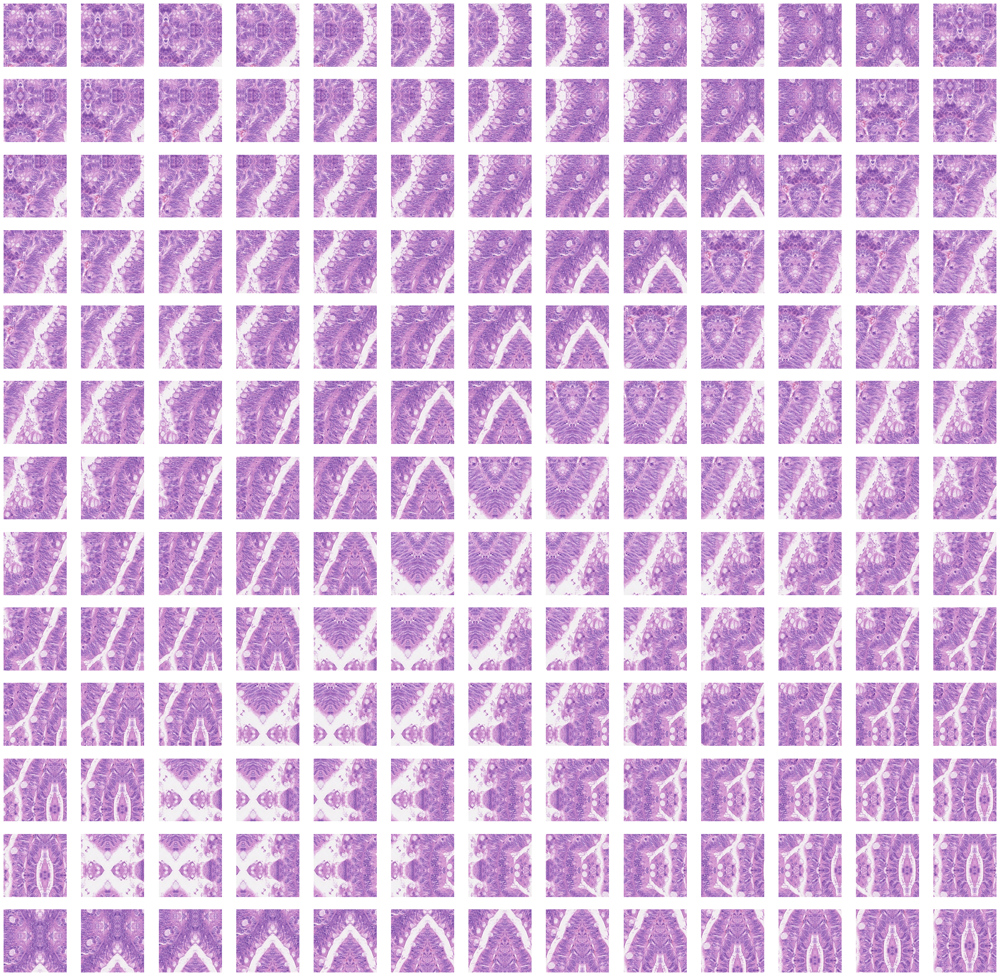

In [8]:
conf['dataset'] = 'consep'
writer_consep = DB_writer(conf, verbose=False)
writer_consep.viz_patches_example(index=3, img_type="img", phase="train")

In [9]:
writer_consep.write_dbs()

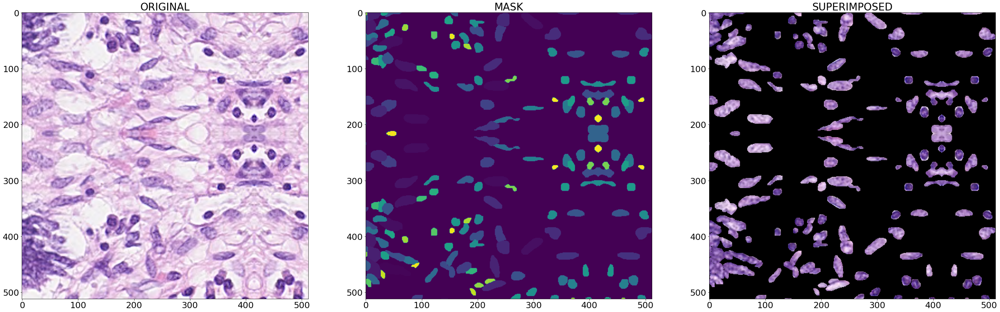

array([  0,   5,  12,  23,  27,  29,  30,  34,  44,  47,  55,  57,  73,
        82,  90,  91,  93, 102, 103, 118, 121, 122, 143, 146, 149, 155,
       157, 160, 163, 183, 195, 198, 199, 204, 213, 218, 234, 236, 237,
       246, 260, 265, 280, 281, 283, 287, 304, 308, 311, 336, 344, 354,
       359, 368, 382, 391, 398, 401, 403, 404, 405, 409, 410, 432, 440,
       446, 447, 452, 455, 462, 472, 483, 487, 512, 537, 553, 565, 602,
       607, 650, 657, 674, 680, 693, 699, 711, 726, 740, 745, 793, 796,
       800, 805, 814], dtype=uint16)

In [10]:
# Visualize masks and image patches for checking correctness
files = [file for file in writer_consep.database_dir.iterdir()]
visualize_db_patches(files[2].as_posix(), index=10)

In [13]:
conf['dataset'] = 'pannuke'
conf['patch_size'] = 256
writer_pannuke = DB_writer(conf, verbose=False)

In [14]:
writer_pannuke.write_dbs()

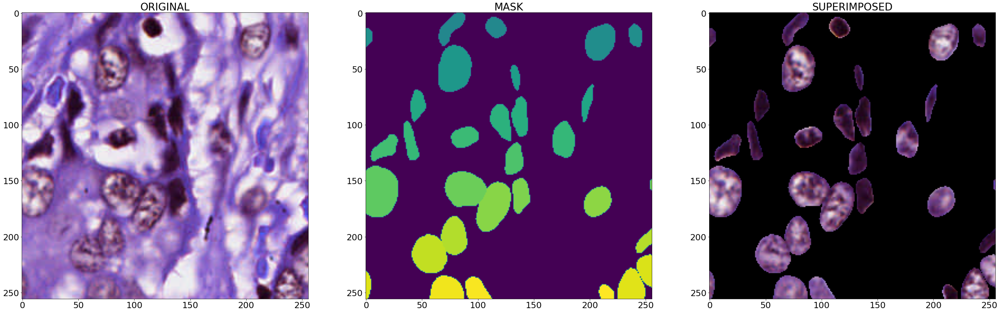

array([  0,  84,  85,  89,  90,  91,  96, 101, 108, 110, 114, 117, 121,
       122, 124, 127, 131, 137, 141, 144, 147, 150, 151, 161, 162, 165,
       172, 173, 174, 178, 180, 182], dtype=uint16)

In [17]:
files = [file for file in writer_pannuke.database_dir.iterdir()]
visualize_db_patches(files[2].as_posix(), index=921)